<a href="https://colab.research.google.com/github/leejihoon98/OC_SORT/blob/master/Basic_GAN_Using_MNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# import the libraries
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [2]:
# visualization function
def show(tensor, ch=1, size=(28,28), num=16):
  # tensor: 128 x 784
  data=tensor.detach().cpu().view(-1,ch,*size) # 128 x 1 x 28 x 28
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)   # 1 x 28 x 28  = 28 x 28 x 1
  plt.imshow(grid)
  plt.show()


In [3]:
# setup of the main parameters and hyperparameters
epochs = 500
cur_step = 0 #current step
info_step = 300
mean_gen_loss = 0 #generator 
mean_disc_loss = 0 #discriminator

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128 #batch size
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),shuffle=True, batch_size=bs)

# number of steps = 60000 / 128 = 468.75

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [4]:
# declare our models

# Generator
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128): #z는 latent vector, i_dim은 input dimension(MNIST dataset), h_dim은 hidden layer dimension
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim), # 64, 128
        genBlock(h_dim, h_dim*2), # 128, 256
        genBlock(h_dim*2, h_dim*4), # 256 x 512
        genBlock(h_dim*4, h_dim*8), # 512, 1024
        nn.Linear(h_dim*8, i_dim), # 1024, 784 (28x28)
        nn.Sigmoid(),
    )

  def forward(self, noise):
       return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

## Discriminator
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc=nn.Sequential(
        discBlock(i_dim, h_dim*4), # 784, 1024
        discBlock(h_dim*4, h_dim*2), # 1024, 512
        discBlock(h_dim*2, h_dim), # 512, 256
        nn.Linear(h_dim, 1) # 256, 1
    )

  def forward(self, image):
      return self.disc(image)

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [6]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [7]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([1, 0, 8, 2, 7, 1, 1, 6, 4, 9])


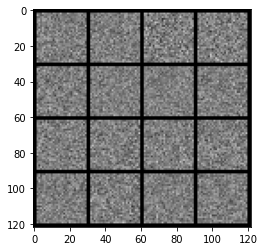

In [8]:
x,y=next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [10]:
# calculating the loss

# generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   pred = disc(fake)
   targets=torch.ones_like(pred)
   gen_loss=loss_func(pred,targets)

   return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   disc_fake = disc(fake.detach())
   disc_fake_targets=torch.zeros_like(disc_fake) #fake는 0으로 labeling
   disc_fake_loss=loss_func(disc_fake, disc_fake_targets)

   disc_real = disc(real)
   disc_real_targets=torch.ones_like(disc_real) #real은 1로 labeling
   disc_real_loss=loss_func(disc_real, disc_real_targets)

   disc_loss=(disc_fake_loss+disc_real_loss)/2

   return disc_loss




  0%|          | 0/469 [00:00<?, ?it/s]

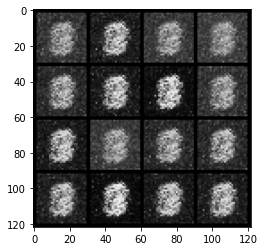

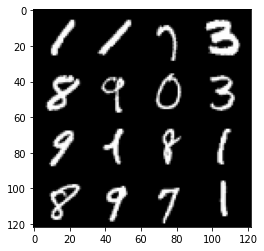

0: step 300 / Gen loss: 1.8713374270995453 / disc_loss: 0.3526797270526487


  0%|          | 0/469 [00:00<?, ?it/s]

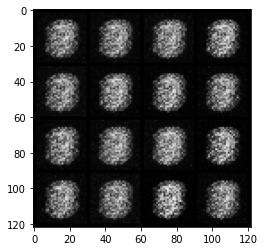

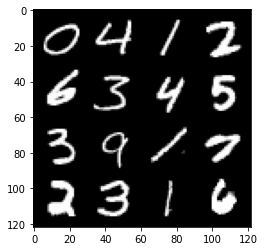

1: step 600 / Gen loss: 3.469184041023254 / disc_loss: 0.1204325661311546


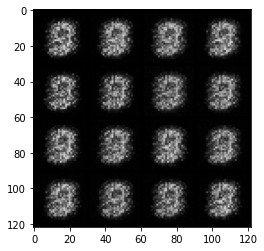

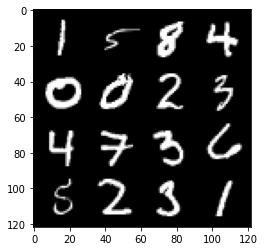

1: step 900 / Gen loss: 3.473597125212352 / disc_loss: 0.05304529923945669


  0%|          | 0/469 [00:00<?, ?it/s]

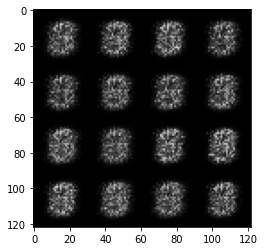

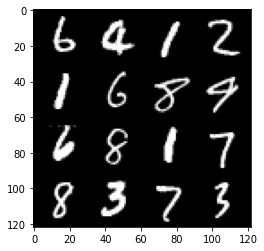

2: step 1200 / Gen loss: 3.5368676932652816 / disc_loss: 0.035699956833074475


  0%|          | 0/469 [00:00<?, ?it/s]

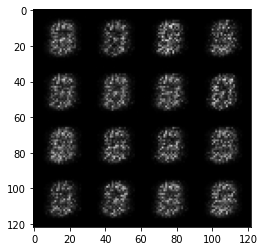

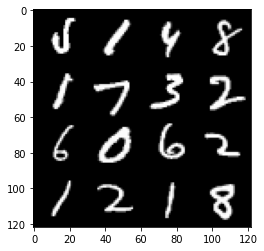

3: step 1500 / Gen loss: 3.4044110790888453 / disc_loss: 0.039107280597090704


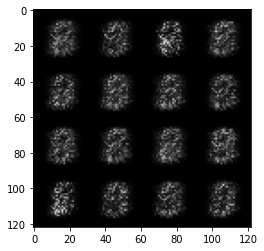

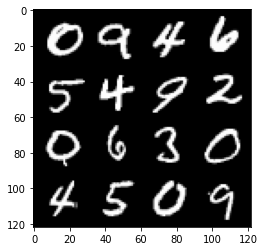

3: step 1800 / Gen loss: 3.4046049666404725 / disc_loss: 0.0425465403497219


  0%|          | 0/469 [00:00<?, ?it/s]

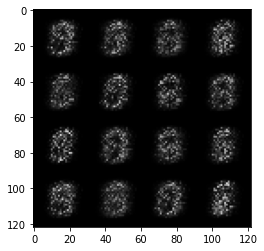

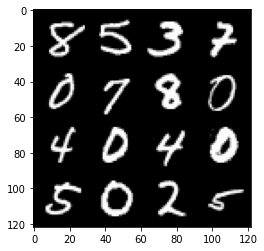

4: step 2100 / Gen loss: 3.6266471139589957 / disc_loss: 0.037744942245384085


  0%|          | 0/469 [00:00<?, ?it/s]

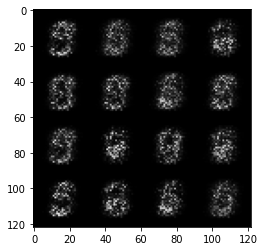

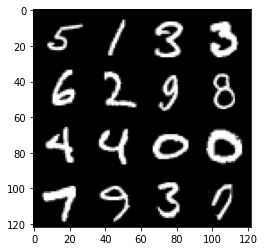

5: step 2400 / Gen loss: 3.9625678126017227 / disc_loss: 0.031617516037076694


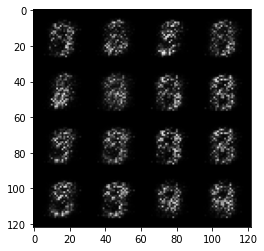

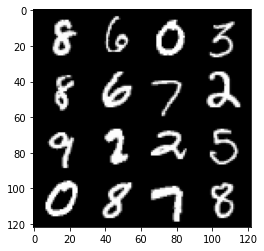

5: step 2700 / Gen loss: 4.467619775136313 / disc_loss: 0.02620718585016827


  0%|          | 0/469 [00:00<?, ?it/s]

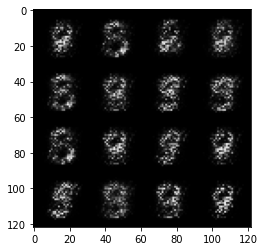

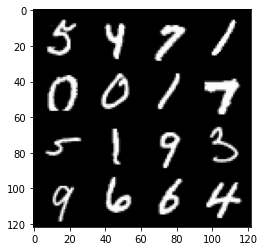

6: step 3000 / Gen loss: 4.716153815587363 / disc_loss: 0.024934938494116075


  0%|          | 0/469 [00:00<?, ?it/s]

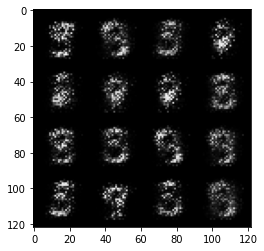

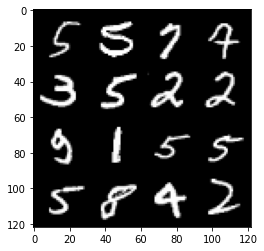

7: step 3300 / Gen loss: 4.830731182098384 / disc_loss: 0.023808286767452936


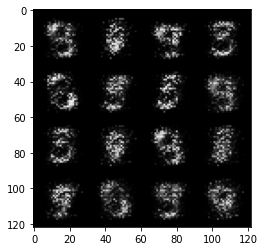

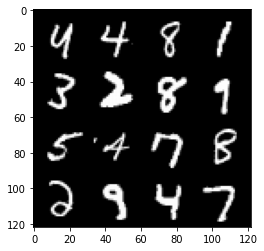

7: step 3600 / Gen loss: 5.283080244064332 / disc_loss: 0.02128506006362538


  0%|          | 0/469 [00:00<?, ?it/s]

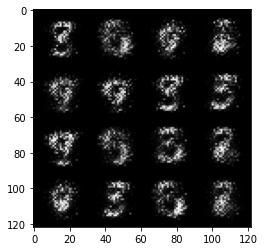

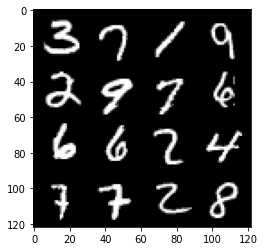

8: step 3900 / Gen loss: 5.57510526339213 / disc_loss: 0.02181169706396759


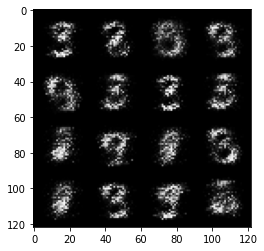

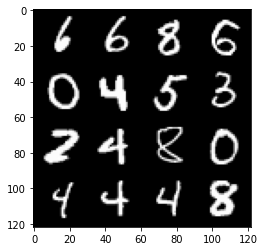

8: step 4200 / Gen loss: 5.7332093826929755 / disc_loss: 0.021969965578367317


  0%|          | 0/469 [00:00<?, ?it/s]

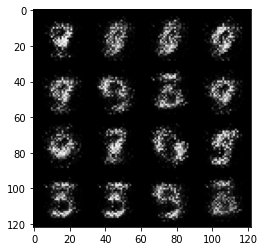

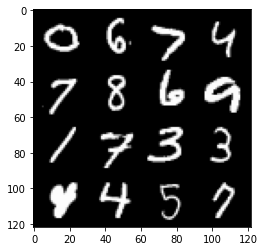

9: step 4500 / Gen loss: 5.564670629501347 / disc_loss: 0.02089079212397337


  0%|          | 0/469 [00:00<?, ?it/s]

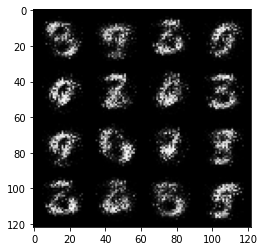

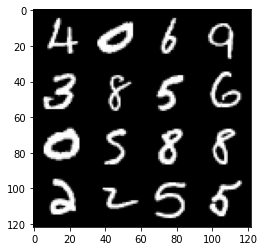

10: step 4800 / Gen loss: 5.947502047220869 / disc_loss: 0.019046536552098894


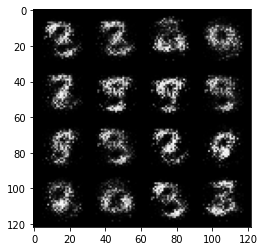

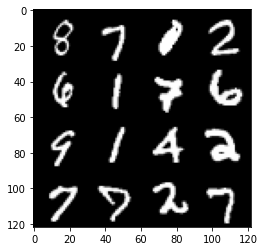

10: step 5100 / Gen loss: 6.189210252761843 / disc_loss: 0.01687590073794127


  0%|          | 0/469 [00:00<?, ?it/s]

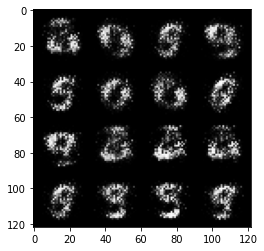

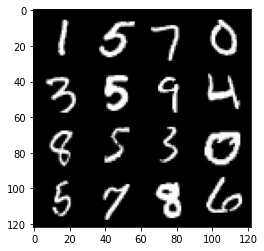

11: step 5400 / Gen loss: 6.263835991223648 / disc_loss: 0.014213190418668096


  0%|          | 0/469 [00:00<?, ?it/s]

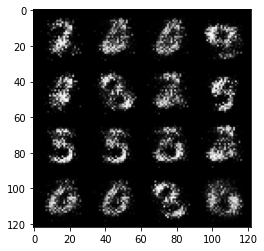

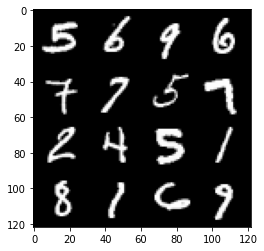

12: step 5700 / Gen loss: 6.301536610921222 / disc_loss: 0.012962079706291367


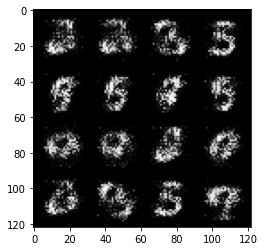

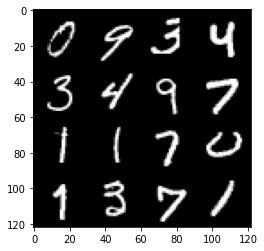

12: step 6000 / Gen loss: 6.539976294835408 / disc_loss: 0.011807247775141153


  0%|          | 0/469 [00:00<?, ?it/s]

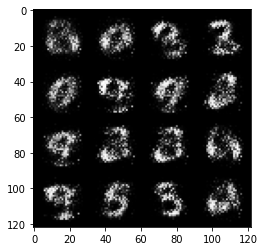

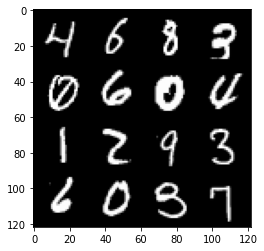

13: step 6300 / Gen loss: 6.829063851038617 / disc_loss: 0.011118735190636176


  0%|          | 0/469 [00:00<?, ?it/s]

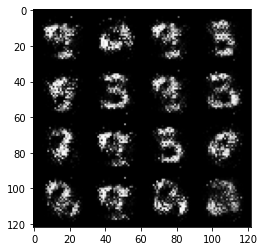

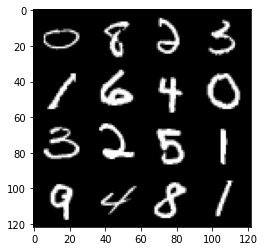

14: step 6600 / Gen loss: 6.7127107095718355 / disc_loss: 0.0111001227198479


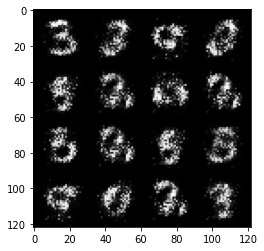

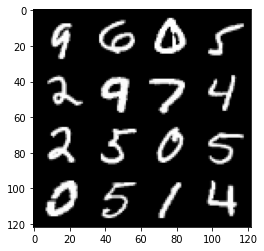

14: step 6900 / Gen loss: 6.565509746869406 / disc_loss: 0.01039965530158953


  0%|          | 0/469 [00:00<?, ?it/s]

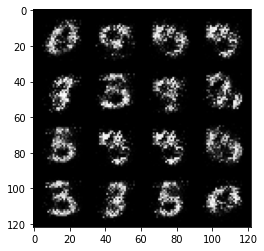

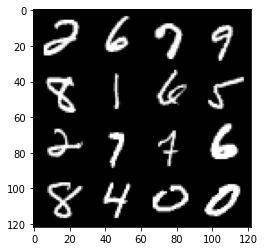

15: step 7200 / Gen loss: 6.796790305773414 / disc_loss: 0.010298362230726839


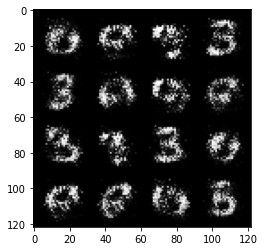

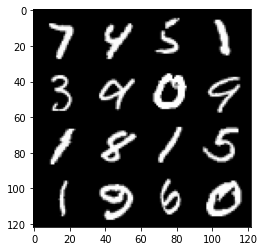

15: step 7500 / Gen loss: 6.833710800806681 / disc_loss: 0.01105370558332652


  0%|          | 0/469 [00:00<?, ?it/s]

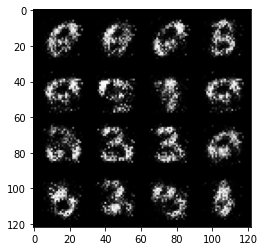

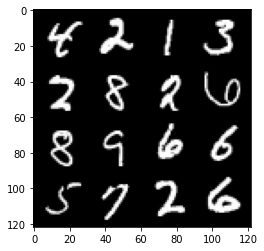

16: step 7800 / Gen loss: 6.975103721618658 / disc_loss: 0.012700800876288363


  0%|          | 0/469 [00:00<?, ?it/s]

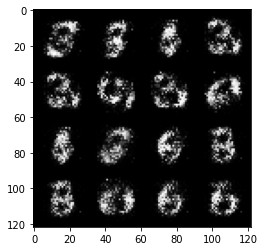

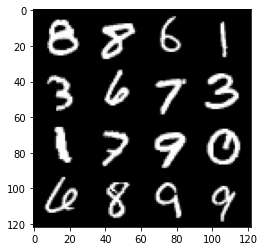

17: step 8100 / Gen loss: 6.975743288993833 / disc_loss: 0.01648726067040116


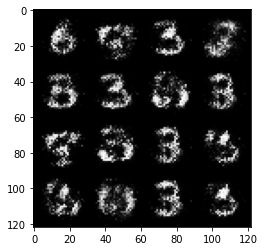

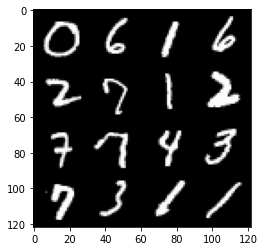

17: step 8400 / Gen loss: 7.105817451477045 / disc_loss: 0.01319683046390613


  0%|          | 0/469 [00:00<?, ?it/s]

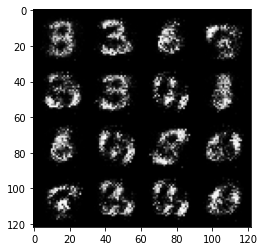

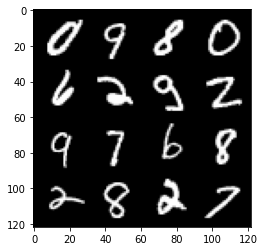

18: step 8700 / Gen loss: 7.300632519721995 / disc_loss: 0.011131284080135325


  0%|          | 0/469 [00:00<?, ?it/s]

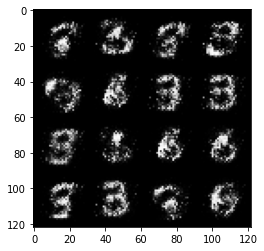

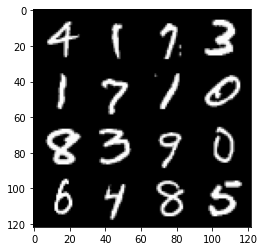

19: step 9000 / Gen loss: 7.206451807022092 / disc_loss: 0.011230905846071747


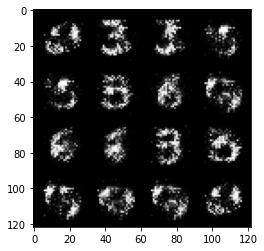

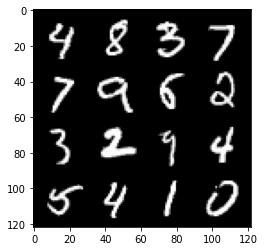

19: step 9300 / Gen loss: 7.088113168080646 / disc_loss: 0.010943661081449438


  0%|          | 0/469 [00:00<?, ?it/s]

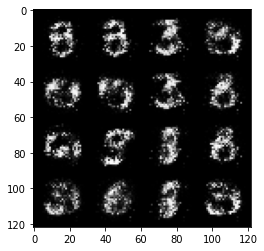

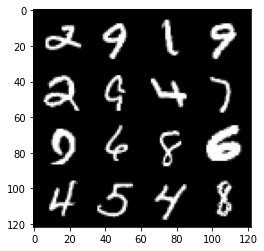

20: step 9600 / Gen loss: 7.0623504384358755 / disc_loss: 0.011085313408014677


  0%|          | 0/469 [00:00<?, ?it/s]

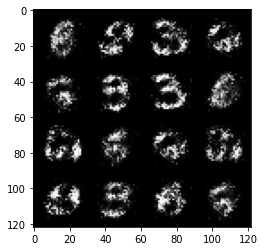

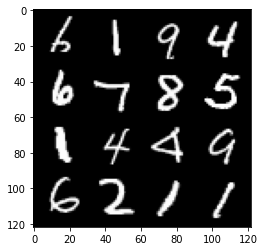

21: step 9900 / Gen loss: 7.34631535847982 / disc_loss: 0.01085402457974851


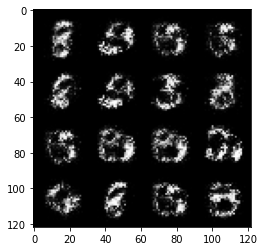

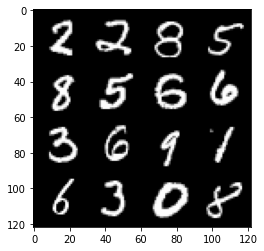

21: step 10200 / Gen loss: 7.263054695129398 / disc_loss: 0.013730249352908381


  0%|          | 0/469 [00:00<?, ?it/s]

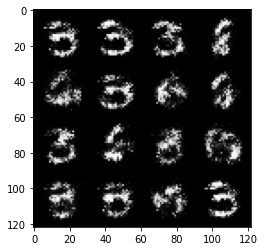

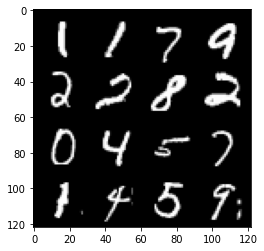

22: step 10500 / Gen loss: 7.383030193646753 / disc_loss: 0.013812147210507336


  0%|          | 0/469 [00:00<?, ?it/s]

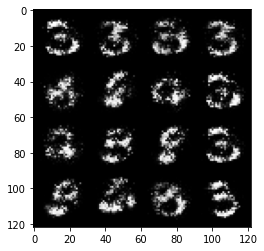

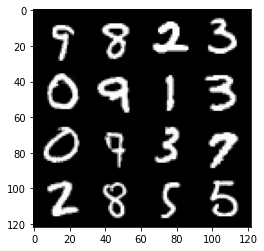

23: step 10800 / Gen loss: 7.254521989822387 / disc_loss: 0.013044230795931073


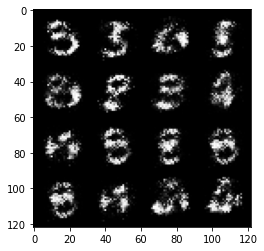

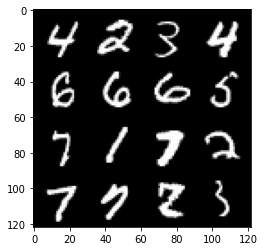

23: step 11100 / Gen loss: 7.15427020549774 / disc_loss: 0.01117454431174944


  0%|          | 0/469 [00:00<?, ?it/s]

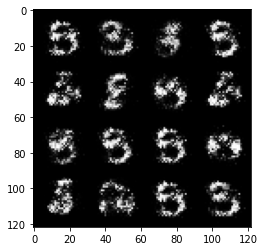

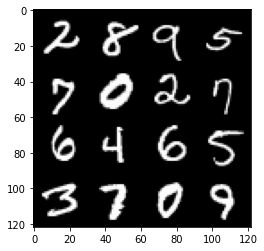

24: step 11400 / Gen loss: 7.239152968724569 / disc_loss: 0.0127302361271965


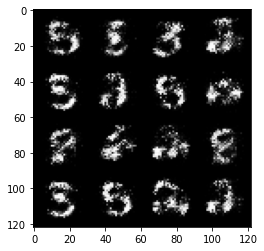

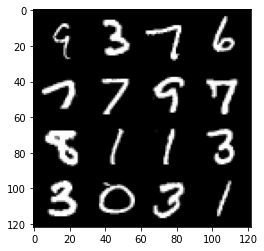

24: step 11700 / Gen loss: 7.137264113426206 / disc_loss: 0.013064582148411625


  0%|          | 0/469 [00:00<?, ?it/s]

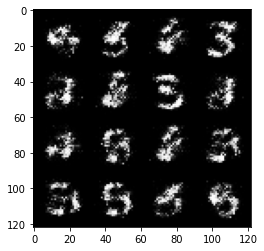

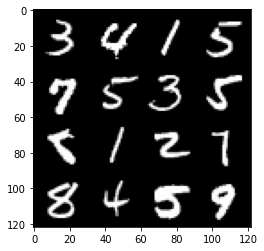

25: step 12000 / Gen loss: 6.95869080861409 / disc_loss: 0.013415421164051323


  0%|          | 0/469 [00:00<?, ?it/s]

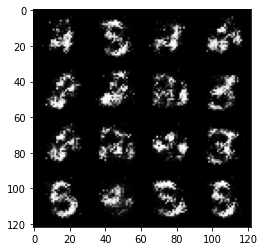

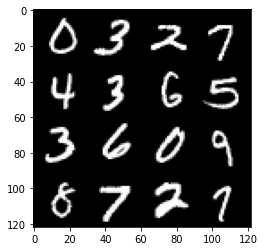

26: step 12300 / Gen loss: 6.867548508644103 / disc_loss: 0.012247478435747316


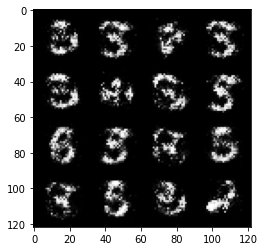

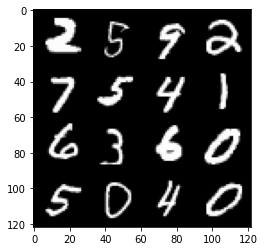

26: step 12600 / Gen loss: 6.623556888898214 / disc_loss: 0.013534760505426678


  0%|          | 0/469 [00:00<?, ?it/s]

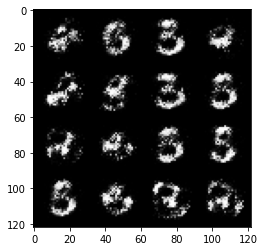

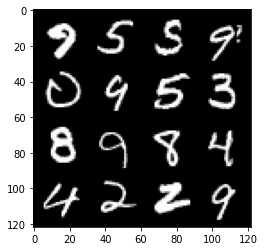

27: step 12900 / Gen loss: 6.780717576344809 / disc_loss: 0.013265180086406569


  0%|          | 0/469 [00:00<?, ?it/s]

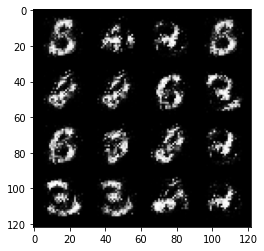

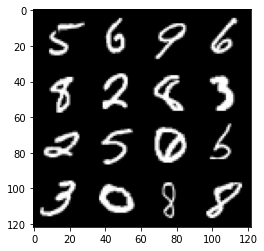

28: step 13200 / Gen loss: 6.603411769866943 / disc_loss: 0.013314540582553784


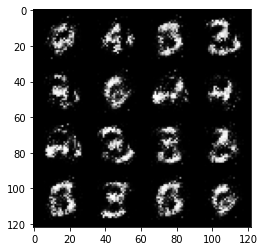

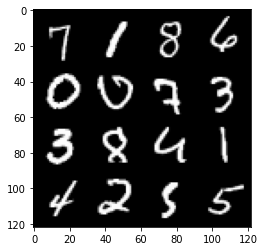

28: step 13500 / Gen loss: 7.1017159064610755 / disc_loss: 0.014250396636780353


  0%|          | 0/469 [00:00<?, ?it/s]

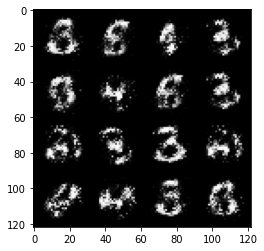

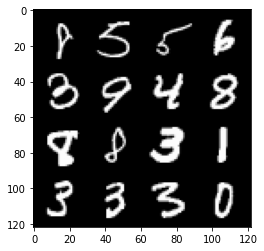

29: step 13800 / Gen loss: 6.986944015820822 / disc_loss: 0.01566034726255262


  0%|          | 0/469 [00:00<?, ?it/s]

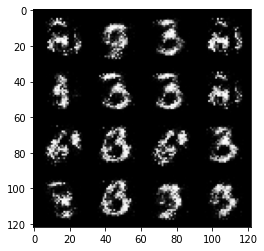

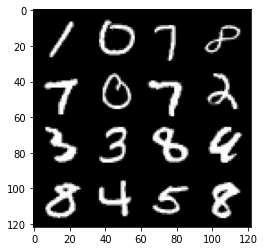

30: step 14100 / Gen loss: 6.8052195612589506 / disc_loss: 0.018323072987453396


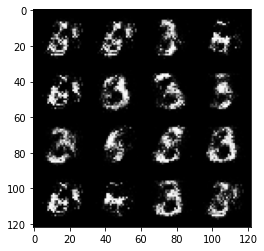

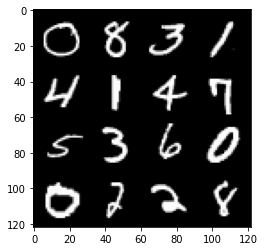

30: step 14400 / Gen loss: 6.7801928774515785 / disc_loss: 0.01729666424604755


  0%|          | 0/469 [00:00<?, ?it/s]

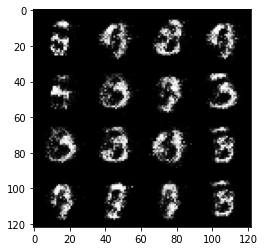

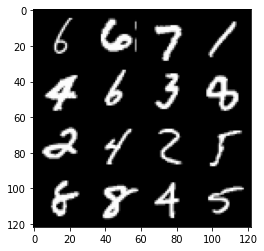

31: step 14700 / Gen loss: 6.325734310150142 / disc_loss: 0.018990948528517026


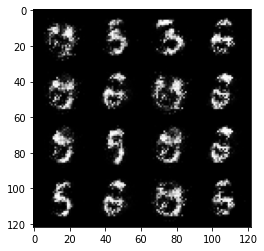

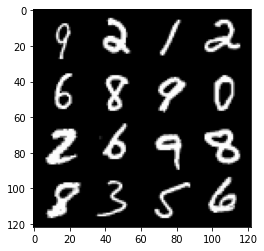

31: step 15000 / Gen loss: 6.174679517745973 / disc_loss: 0.021451621303955705


  0%|          | 0/469 [00:00<?, ?it/s]

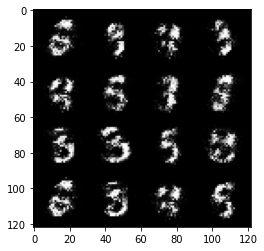

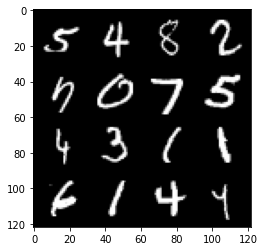

32: step 15300 / Gen loss: 6.355514159202576 / disc_loss: 0.022884864412092917


  0%|          | 0/469 [00:00<?, ?it/s]

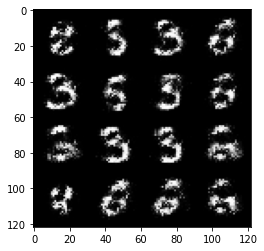

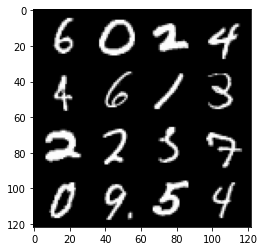

33: step 15600 / Gen loss: 6.415415058135988 / disc_loss: 0.022511762008070948


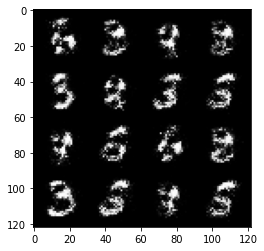

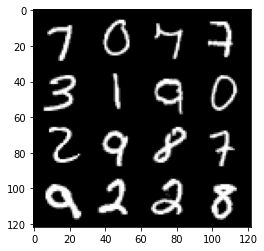

33: step 15900 / Gen loss: 6.329950302441913 / disc_loss: 0.02483738805012155


  0%|          | 0/469 [00:00<?, ?it/s]

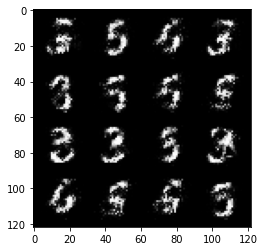

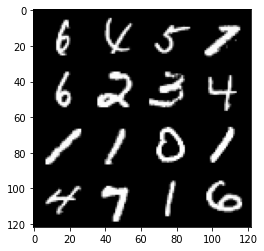

34: step 16200 / Gen loss: 6.397457869847612 / disc_loss: 0.022517254544266795


  0%|          | 0/469 [00:00<?, ?it/s]

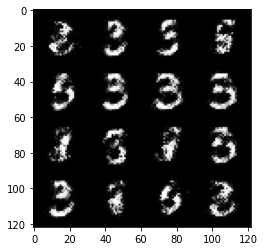

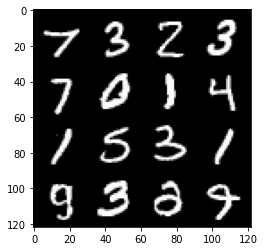

35: step 16500 / Gen loss: 6.2494424438476575 / disc_loss: 0.028294110360244908


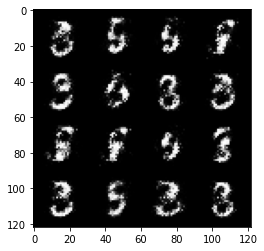

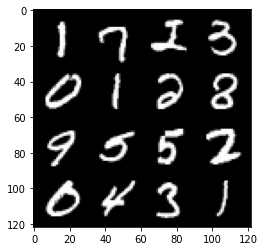

35: step 16800 / Gen loss: 6.008626823425288 / disc_loss: 0.02560665608383716


  0%|          | 0/469 [00:00<?, ?it/s]

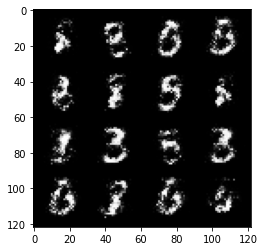

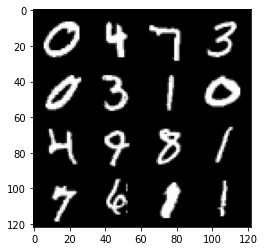

36: step 17100 / Gen loss: 6.209282460212703 / disc_loss: 0.028453347878530634


  0%|          | 0/469 [00:00<?, ?it/s]

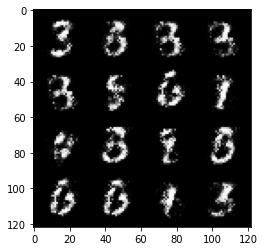

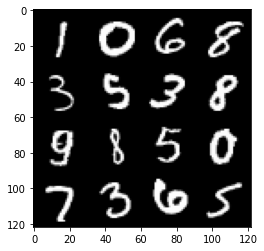

37: step 17400 / Gen loss: 6.16191352367401 / disc_loss: 0.031978471622181426


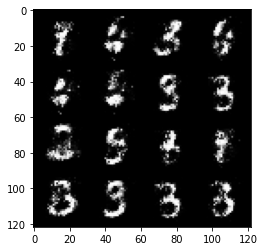

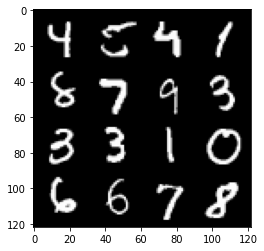

37: step 17700 / Gen loss: 5.918879429499305 / disc_loss: 0.02996944801726688


  0%|          | 0/469 [00:00<?, ?it/s]

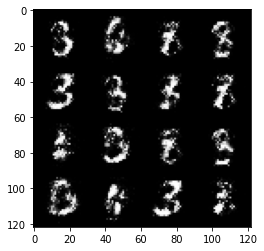

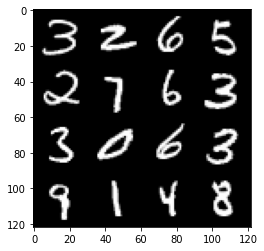

38: step 18000 / Gen loss: 6.306587327321368 / disc_loss: 0.02663957213362059


  0%|          | 0/469 [00:00<?, ?it/s]

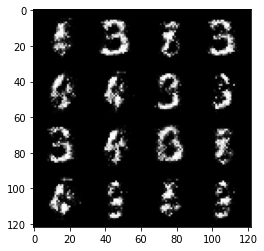

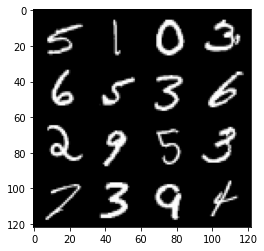

39: step 18300 / Gen loss: 6.19695018609365 / disc_loss: 0.031383692903133725


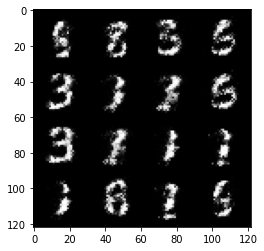

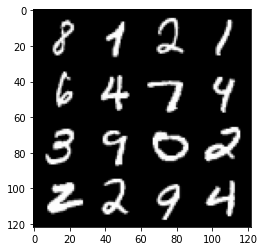

39: step 18600 / Gen loss: 6.014877980550133 / disc_loss: 0.034476661969286705


  0%|          | 0/469 [00:00<?, ?it/s]

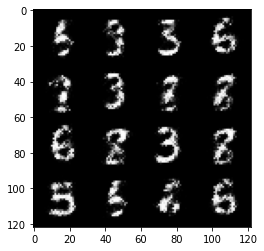

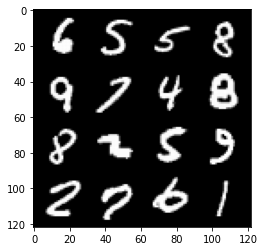

40: step 18900 / Gen loss: 5.674438298543297 / disc_loss: 0.041983357716041274


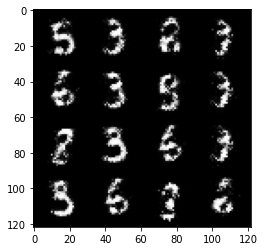

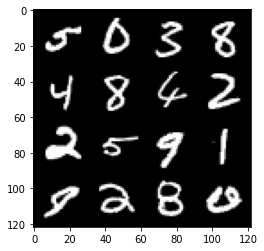

40: step 19200 / Gen loss: 5.478228516578679 / disc_loss: 0.04331936906402308


  0%|          | 0/469 [00:00<?, ?it/s]

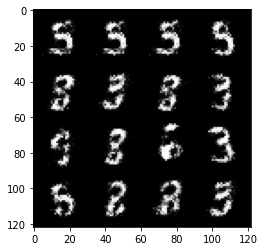

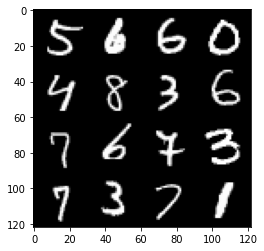

41: step 19500 / Gen loss: 5.457860034306845 / disc_loss: 0.04684439206495877


  0%|          | 0/469 [00:00<?, ?it/s]

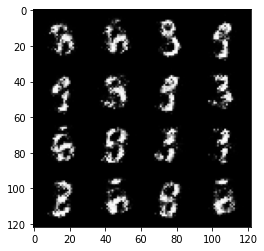

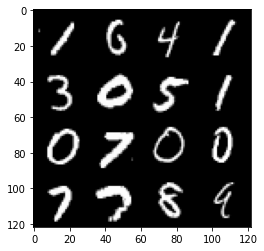

42: step 19800 / Gen loss: 5.353361794153851 / disc_loss: 0.04452613536268473


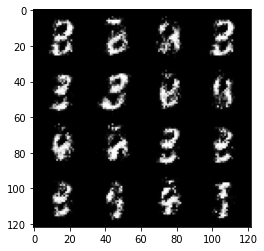

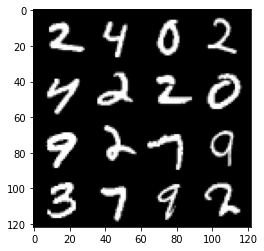

42: step 20100 / Gen loss: 5.439642494519552 / disc_loss: 0.04232031295696891


  0%|          | 0/469 [00:00<?, ?it/s]

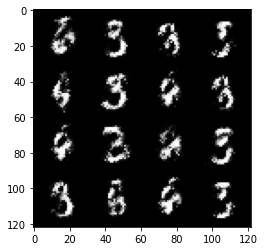

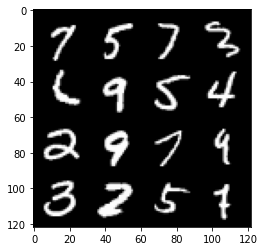

43: step 20400 / Gen loss: 5.911416039466861 / disc_loss: 0.042340600484361245


  0%|          | 0/469 [00:00<?, ?it/s]

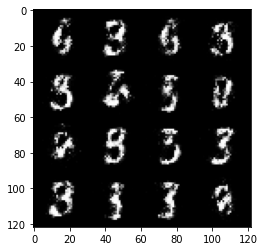

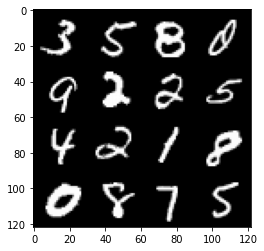

44: step 20700 / Gen loss: 5.603589636484781 / disc_loss: 0.04561135393101721


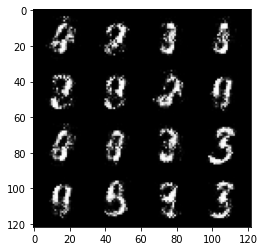

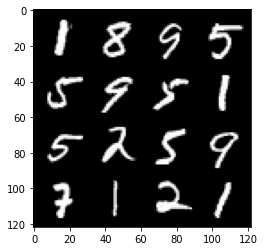

44: step 21000 / Gen loss: 5.507459294001265 / disc_loss: 0.04187605419196185


  0%|          | 0/469 [00:00<?, ?it/s]

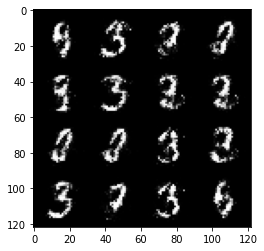

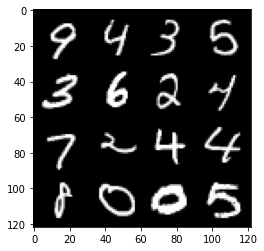

45: step 21300 / Gen loss: 5.541930249532068 / disc_loss: 0.037202487640703746


  0%|          | 0/469 [00:00<?, ?it/s]

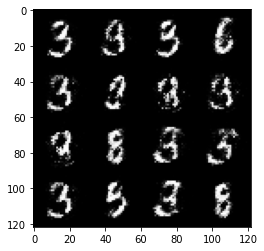

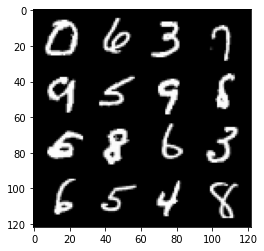

46: step 21600 / Gen loss: 5.424240293502808 / disc_loss: 0.05351500695881743


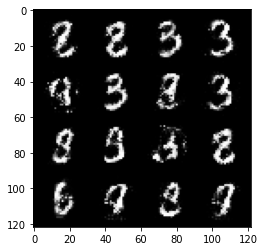

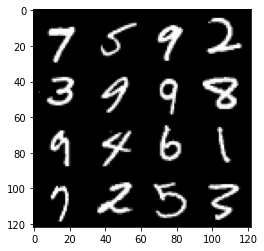

46: step 21900 / Gen loss: 5.553395576477052 / disc_loss: 0.04510447731862461


  0%|          | 0/469 [00:00<?, ?it/s]

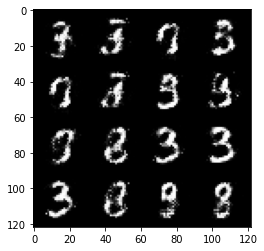

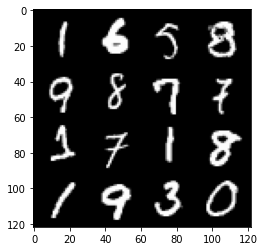

47: step 22200 / Gen loss: 5.261880779266359 / disc_loss: 0.048908414210503334


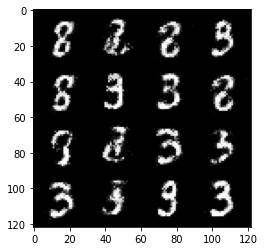

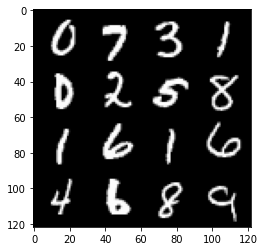

47: step 22500 / Gen loss: 5.597663505872092 / disc_loss: 0.0582826804618041


  0%|          | 0/469 [00:00<?, ?it/s]

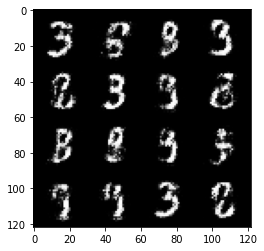

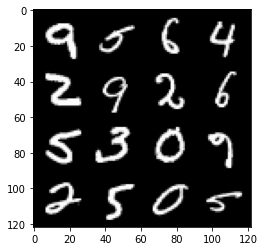

48: step 22800 / Gen loss: 5.188459605375925 / disc_loss: 0.07355547533370553


  0%|          | 0/469 [00:00<?, ?it/s]

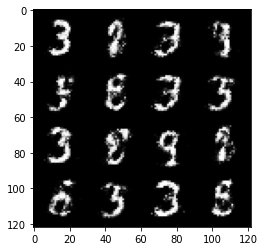

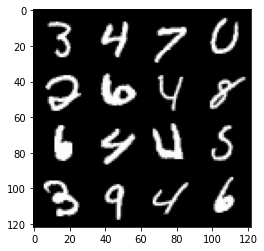

49: step 23100 / Gen loss: 5.1864782031377175 / disc_loss: 0.06545949251390996


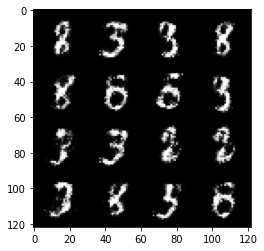

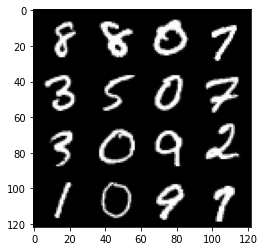

49: step 23400 / Gen loss: 4.873023177782699 / disc_loss: 0.06756162941455833


  0%|          | 0/469 [00:00<?, ?it/s]

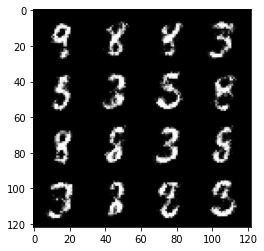

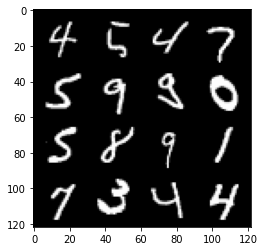

50: step 23700 / Gen loss: 4.968601777553559 / disc_loss: 0.05329058084016046


  0%|          | 0/469 [00:00<?, ?it/s]

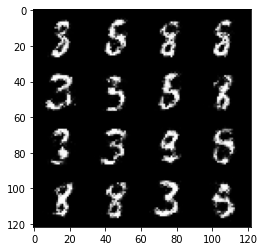

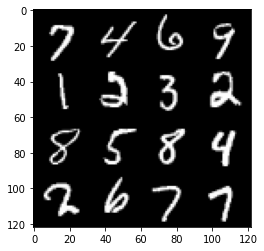

51: step 24000 / Gen loss: 5.020126018524169 / disc_loss: 0.06654827067628499


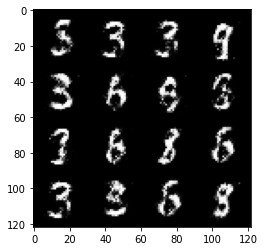

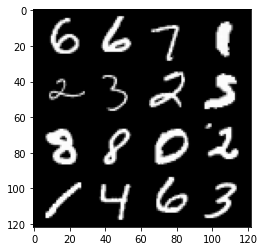

51: step 24300 / Gen loss: 4.719944800535839 / disc_loss: 0.07431987445801504


  0%|          | 0/469 [00:00<?, ?it/s]

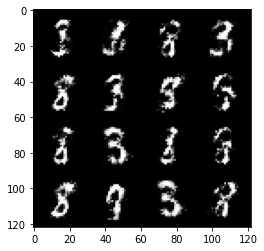

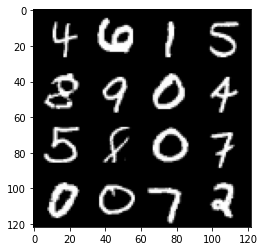

52: step 24600 / Gen loss: 4.899266095956166 / disc_loss: 0.06221196614516276


  0%|          | 0/469 [00:00<?, ?it/s]

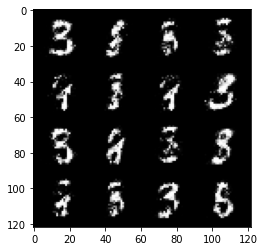

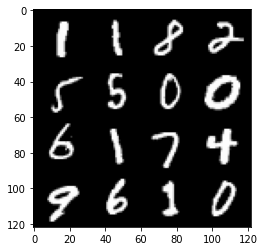

53: step 24900 / Gen loss: 4.964459137121835 / disc_loss: 0.054340216911708296


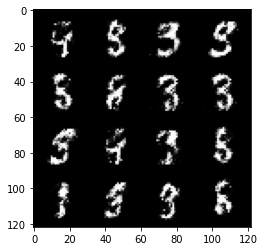

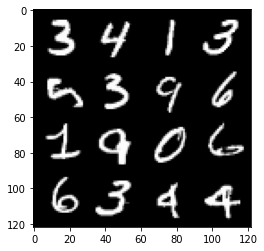

53: step 25200 / Gen loss: 5.163184150854747 / disc_loss: 0.05958536893129347


  0%|          | 0/469 [00:00<?, ?it/s]

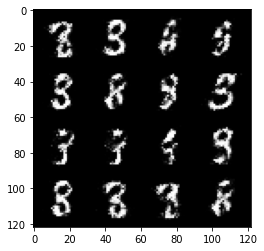

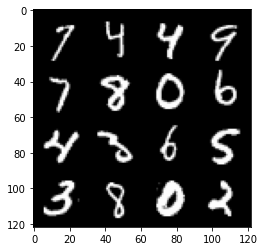

54: step 25500 / Gen loss: 5.106418940226232 / disc_loss: 0.06433521687829241


  0%|          | 0/469 [00:00<?, ?it/s]

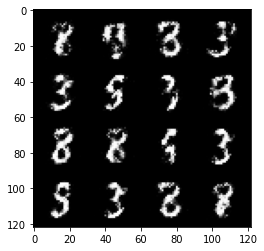

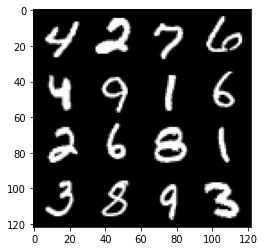

55: step 25800 / Gen loss: 5.225468323230742 / disc_loss: 0.07593030262117587


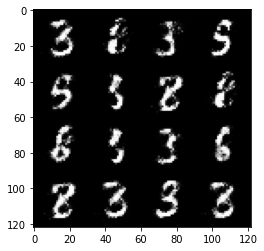

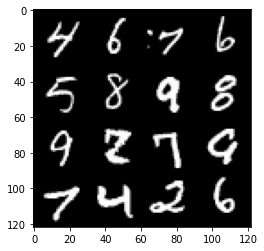

55: step 26100 / Gen loss: 4.706271714369457 / disc_loss: 0.07760331061358249


  0%|          | 0/469 [00:00<?, ?it/s]

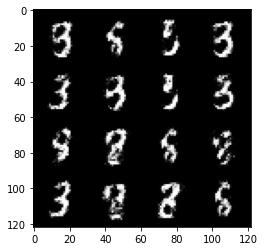

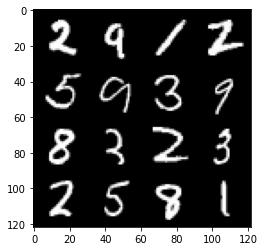

56: step 26400 / Gen loss: 4.683121817906695 / disc_loss: 0.0816950979207953


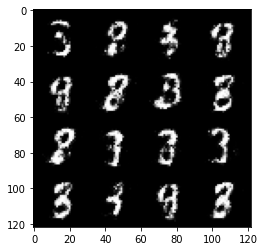

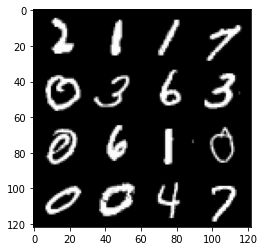

56: step 26700 / Gen loss: 4.715400826931001 / disc_loss: 0.07833179205656057


  0%|          | 0/469 [00:00<?, ?it/s]

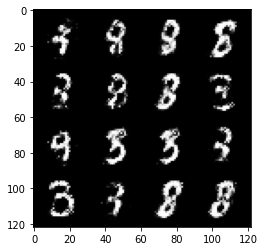

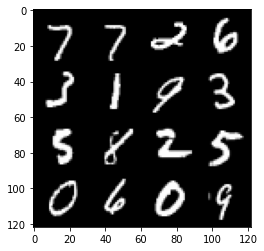

57: step 27000 / Gen loss: 4.510748133659361 / disc_loss: 0.09374335767080379


  0%|          | 0/469 [00:00<?, ?it/s]

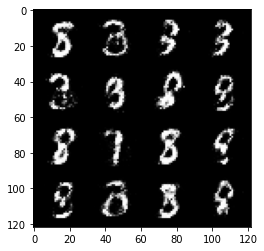

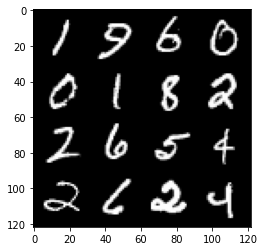

58: step 27300 / Gen loss: 4.7134766753514565 / disc_loss: 0.07188067611927791


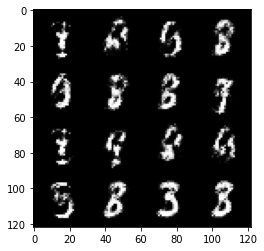

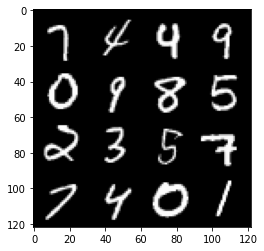

58: step 27600 / Gen loss: 4.73164068937302 / disc_loss: 0.07935790270566942


  0%|          | 0/469 [00:00<?, ?it/s]

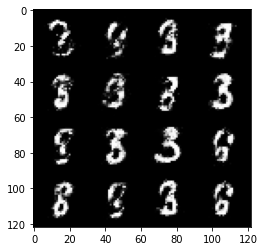

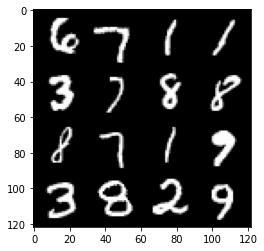

59: step 27900 / Gen loss: 4.908081758817036 / disc_loss: 0.08027378356084226


  0%|          | 0/469 [00:00<?, ?it/s]

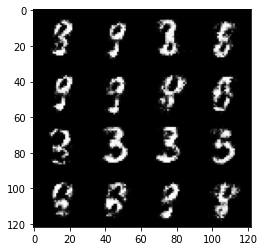

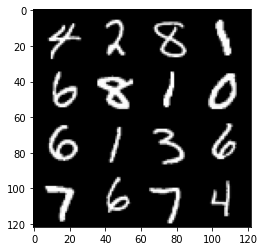

60: step 28200 / Gen loss: 4.698056677182517 / disc_loss: 0.08499767993266384


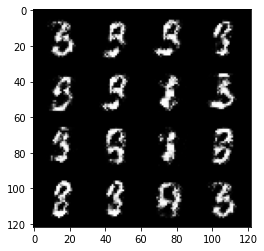

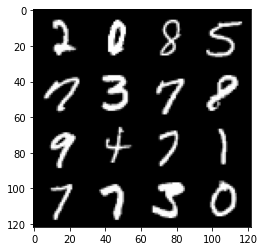

60: step 28500 / Gen loss: 4.555208357175191 / disc_loss: 0.0959377438326677


  0%|          | 0/469 [00:00<?, ?it/s]

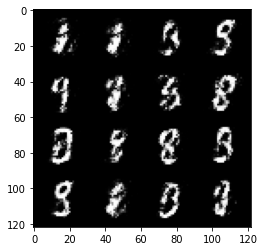

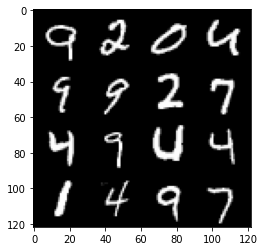

61: step 28800 / Gen loss: 4.578286372025809 / disc_loss: 0.09994158123930293


  0%|          | 0/469 [00:00<?, ?it/s]

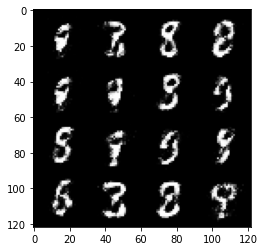

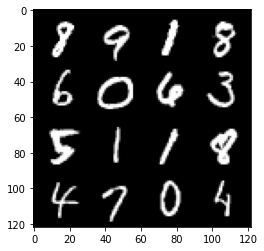

62: step 29100 / Gen loss: 4.411383199691771 / disc_loss: 0.10781212969372671


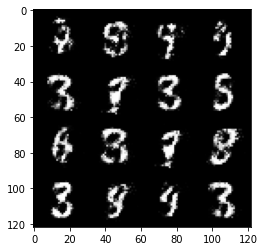

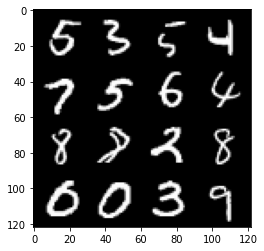

62: step 29400 / Gen loss: 4.282376208305357 / disc_loss: 0.10121169019490477


  0%|          | 0/469 [00:00<?, ?it/s]

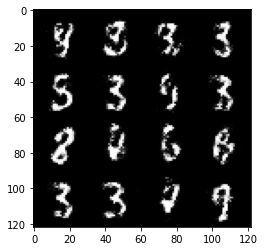

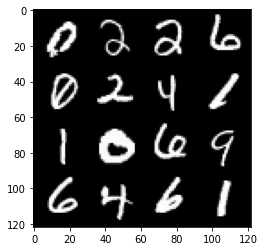

63: step 29700 / Gen loss: 4.26783382177353 / disc_loss: 0.09854041998585064


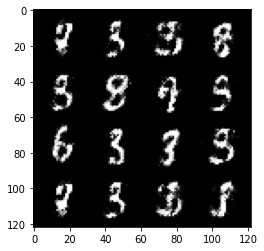

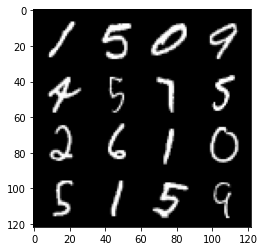

63: step 30000 / Gen loss: 4.37787745475769 / disc_loss: 0.08730189304798838


  0%|          | 0/469 [00:00<?, ?it/s]

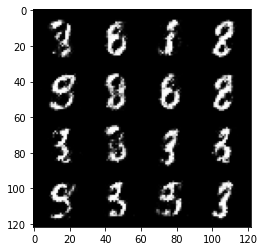

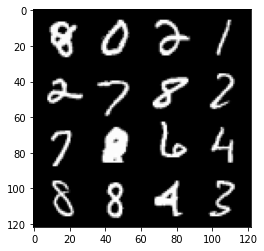

64: step 30300 / Gen loss: 4.452137405872347 / disc_loss: 0.08018216650933034


  0%|          | 0/469 [00:00<?, ?it/s]

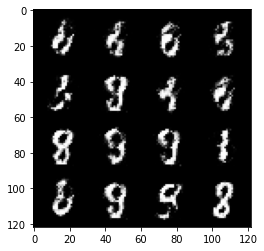

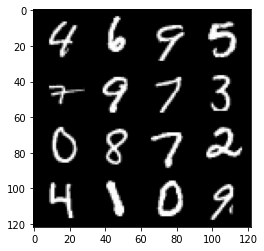

65: step 30600 / Gen loss: 4.435686470667523 / disc_loss: 0.09584515073647105


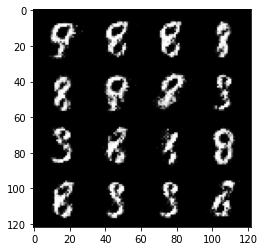

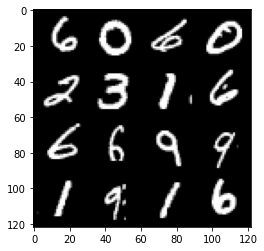

65: step 30900 / Gen loss: 4.273655190467832 / disc_loss: 0.098826268427074


  0%|          | 0/469 [00:00<?, ?it/s]

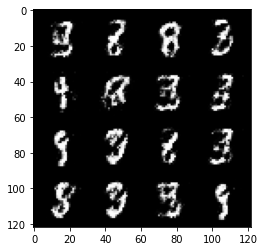

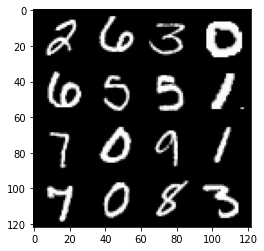

66: step 31200 / Gen loss: 4.344158136844632 / disc_loss: 0.09315726188321911


  0%|          | 0/469 [00:00<?, ?it/s]

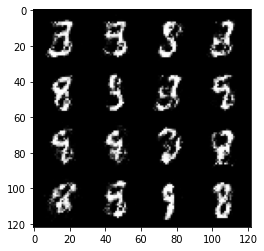

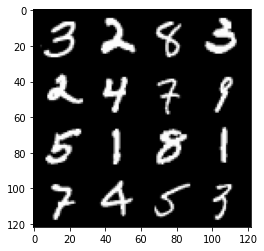

67: step 31500 / Gen loss: 4.401233323415123 / disc_loss: 0.09468392033750808


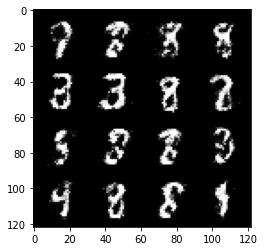

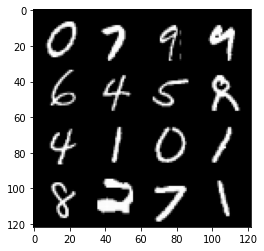

67: step 31800 / Gen loss: 4.617855300903319 / disc_loss: 0.08233947038029628


  0%|          | 0/469 [00:00<?, ?it/s]

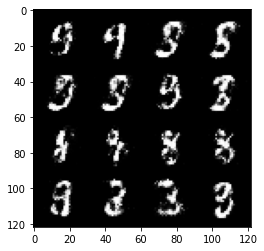

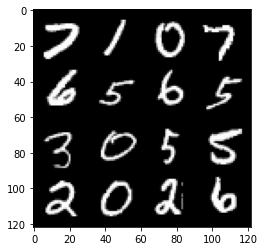

68: step 32100 / Gen loss: 4.3694585426648445 / disc_loss: 0.09710632490615045


  0%|          | 0/469 [00:00<?, ?it/s]

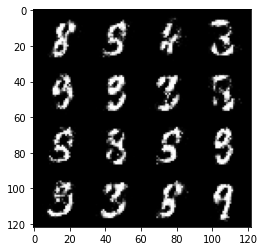

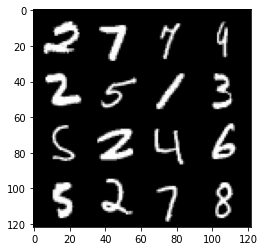

69: step 32400 / Gen loss: 4.404220210711164 / disc_loss: 0.09239295781900488


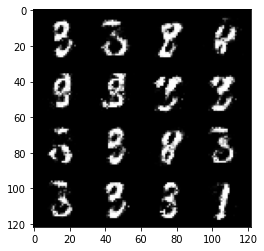

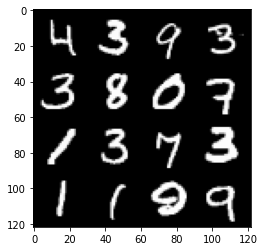

69: step 32700 / Gen loss: 4.496874965826671 / disc_loss: 0.09878549973169967


  0%|          | 0/469 [00:00<?, ?it/s]

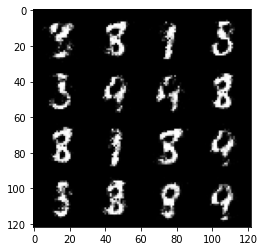

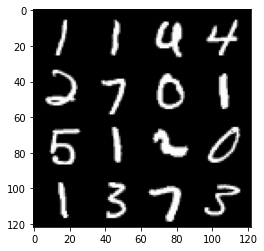

70: step 33000 / Gen loss: 4.3257167855898535 / disc_loss: 0.09574317255367827


In [ ]:
### 60000 / 128 = 468.75  = 469 steps in each epoch
### Each step is going to process 128 images = size of the batch (except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ### discriminator
    disc_opt.zero_grad()

    cur_bs=len(real) # real: 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)
    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ### generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    ### visualization & stats
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1
